## Solar System Simulation

In this tutorial, we'll explore orbital mechanics by conducting a simple simulation of the Solar System. For simplicity, we'll simulate up to Mars, providing a foundational understanding of the process. Expanding the simulation to include more planets is easily achievable.

The code aims not only to create a visual simulation but also to explain each step comprehensively. This breakdown facilitates a deeper understanding of how these simulations function, enabling replication for different scenarios.

Let's begin by introducing the packages used: *numpy* for mathematical operations related to planetary orbits, *matplotlib* for graphical representation and animation, *astropy.time* for temporal evolution, and *astroquery.jplhorizons* for obtaining initial conditions from the Horizons database: https://ssd.jpl.nasa.gov/?horizons.


In [27]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from astropy.time import Time
from astroquery.jplhorizons import Horizons

Once our packages are imported, let's start by defining the start date of our simulation and its total duration. This is important because depending on the chosen date, the data collected from the Horizons database will vary (such as the initial position of each planet at the beginning of the simulation). In our case, we will take a duration of 2 years to observe a complete orbit of Mars around the Sun. The start date will be January 2022, so the simulation ends in the present, January 2024.

In [28]:
sim_start_date = "2022-01-01"
sim_duration = 2 * 365

Now let's define the elements of our simulation. For this purpose, we will create an object of the *Object* class. This allows us to organize and structure specific characteristics, parameters, or functions associated with the objects we are defining, in this case, the planets of the Solar System.

In [29]:
class Object:
    def __init__(self, name, rad, color, r, v):
        self.name = name
        self.r = np.array(r, dtype=float)
        self.v = np.array(v, dtype=float)
        self.xs = []
        self.ys = []
        self.plot = ax.scatter(r[0], r[1], color=color, s=rad**2, edgecolors=None, zorder=10)
        self.line, = ax.plot([], [], color=color, linewidth=0.8)
        self.label = ax.text(r[0], r[1]+0.05, name, ha='center', va='center', fontsize='small', zorder=11)

Looking at the defined class, the following attributes have been assigned to each object:
- name: Name of the object
- r: Position vector
- v: Velocity vector
- xs and ys are empty lists to store the 2D coordinates for our simulation
- plot: Graphical representation of our object, in this case, a point representing the planet in question
- line: Line showing the past trajectory of the object
- label: Label with the name of each object

With all this, the defined *Object* class encapsulates the information and visualization commands for each object in the final simulation. This allows us to associate the positions, velocities, trajectory, and color of, for example, Mercury to a single point.

Next, we will define another class to represent our Solar System as a whole (*SolarSystem*). For this, we will name a total of 4 attributes: the Sun (*thesun*), the planets (*planet*), their trajectory (*evolve*), and the simulation time (*formatted_date*).

In [30]:
class SolarSystem:
    def __init__(self, thesun):
        self.thesun = thesun
        self.planets = []
        self.time = None
        self.timestamp = ax.text(.03, .94, 'Date: ', color='black', transform=ax.transAxes, fontsize='x-large')

    def add_planet(self, planet):
        self.planets.append(planet)

    def evolve(self, i):
        dt = 1.0
        self.time += dt
        plots = []
        lines = []
        for p in self.planets:
            p.r += p.v * dt
            acc = -2.959e-4 * p.r / np.sum(p.r**2)**(3./2)
            p.v += acc * dt
            p.xs.append(p.r[0])
            p.ys.append(p.r[1])
            p.plot.set_offsets(p.r[:2])
            p.line.set_xdata(p.xs)
            p.line.set_ydata(p.ys)
            p.label.set_position((p.r[0], p.r[1]+0.05))
            plots.append(p.plot)
            lines.append(p.line)
            plots.append(p.label)

        formatted_date = Time(self.time, format='jd').iso.split()[0]
        self.timestamp.set_text('Date: ' + formatted_date)
        return plots + lines + [self.timestamp]


Regarding the first two attributes, they will simply be used to attach the data and parameters we want later on. Therefore, we will focus on the last two attributes. As for time, the date format and display type have been defined, which will appear throughout the simulation. On the other hand, for the trajectory, things get complicated, and we reach the part that every physicist hates: solving differential equations. However, fortunately, *Python* and approximate mathematical methods make our work much easier. Applying the Euler integration method in the law of Universal Gravitation (which describes how planets rotate, ignoring relativity for a moment), we can define the position and velocities as follows:

In [31]:
from IPython.display import display, Math

pos = r'\vec{r}_{new} = \vec{r}_{old} + \vec{v}_{old} \, dt'
display(Math(pos))

vel = r'\vec{v}_{new} = \vec{r}_{old} + \vec{a} \, dt'
display(Math(vel))


<IPython.core.display.Math object>

<IPython.core.display.Math object>

Where the acceleration is given by the previously mentioned law of Universal Gravitation.

In [32]:
acc = r'\vec{a} = \frac{GM}{|\vec{r}|^2} \frac{\vec{r}}{|\vec{r}|}'
display(Math(acc))

<IPython.core.display.Math object>

(The above code is used simply to present equations in Python as LaTeX type.)

On the internet, we can find a lot of information about these types of processes and approximations. In this case, we have proceeded in this way, although it may be interesting to use simply Kepler's Law for other projects on orbits.

By introducing these equations into the previously defined attributes, we would already have each object in our simulation related to orbital equations that provide the trajectory and movement we were looking for. We only need the initial conditions, which will be added with Horizons later.

Since it's not so simple to visualize animations with Jupyter, we are going to define a function that allows us to obtain a PNG image of the last frame of our simulation.

In [33]:
def save_last_frame_as_image(fig, filename):
    fig.savefig(filename)

Next, we set up the style of our plot where the animation will take place. The parameters used are commonly used and depend on personal preferences. For my case, I have specified a simple appearance, without axes, and with the same scale for both. By varying *xlim* and *ylim*, we can expand the limits of our simulation, which can be useful if we add the outer planets.

(-1.8, 1.8, -1.8, 1.8)

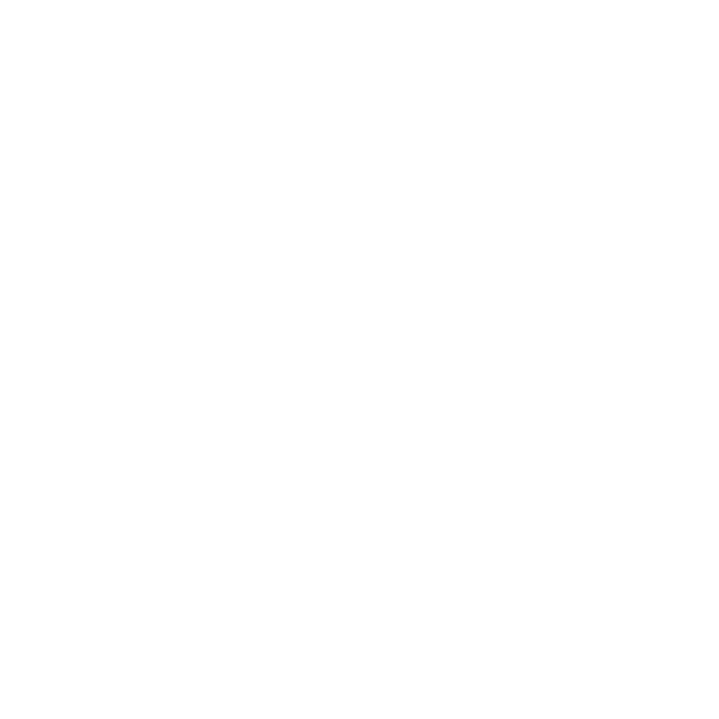

In [34]:
plt.style.use('default')
fig = plt.figure(figsize=[7, 7])
ax = plt.axes([0., 0., 1., 1.], xlim=(-1.8, 1.8), ylim=(-1.8, 1.8))
ax.set_aspect('equal')
ax.axis('off')

*(When executing this part, we get a blank square due to how the base figure of our simulation has been specified)*.

With all this, we already have the foundation of our Solar System. We only need to specify and define the objects with the parameters and aesthetics we want, that is, the Sun and the planets from Mercury to Mars. To do this, we simply use the previously defined classes and provide different information through loops.

In [35]:
ss = SolarSystem(Object("Sun", 35, '#FFD700', [0, 0, 0], [0, 0, 0]))
ss.time = Time(sim_start_date).jd
sizes = [0.38, 0.95, 1., 0.53]
names = ['Mercury', 'Venus', 'Earth', 'Mars']
planet_colors = ['gray', 'green', 'blue', 'chocolate']
for i, nasaid in enumerate([1, 2, 3, 4]):
    obj = Horizons(id=nasaid, location="@sun", epochs=ss.time, id_type=None).vectors()
    ss.add_planet(Object(names[i], 5 * sizes[i], planet_colors[i],
                         [np.double(obj[xi]) for xi in ['x', 'y', 'z']],
                         [np.double(obj[vxi]) for vxi in ['vx', 'vy', 'vz']]))

As mentioned earlier, Horizons has been used to obtain the initial conditions of positions and velocities for each defined planet. For enhanced visualization, characteristic colors have been assigned to each planet.

To make our simulation follow the defined trajectories, we create the *animate* function based on the previously defined *evolve* attribute. We utilize the *animation* package from *matplotlib* to execute it, specifying a duration that aligns with the two years mentioned earlier, with a 20-millisecond interval between frames.

In [36]:
def animate(i):
    return ss.evolve(i)

animation = animation.FuncAnimation(fig, animate, repeat=False, frames=sim_duration, blit=True, interval=20)

plt.show()

If we execute this code in a *Python* graphical environment, a pop-up window displaying our simulation may appear. However, in Jupyter Notebook, it's not as straightforward, so we need to take a couple of extra steps.

Firstly, and recalling the function we defined earlier, we can capture an image of the last simulated frame and save it in our working directory."

In [38]:
save_last_frame_as_image(fig, 'solar_system_last_frame_init.png')

Next, we can use *matplotlib*'s *image* module to display that image by specifying the path to the corresponding file.

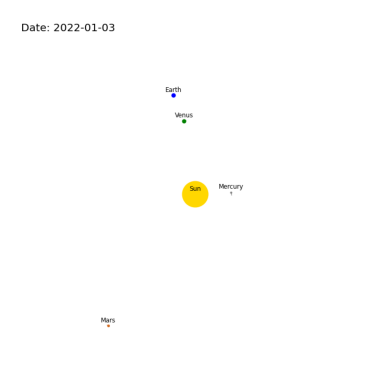

In [40]:
import matplotlib.image as mpimg

# Image path in your directory
image_1_path = '/home/sergio/Escritorio/Master/Comunicación de la Astrofísica/Proyecto TIC/ProyectoTICPrueba/solar_system_last_frame_init.png'

# Load the image using matplotlib.image
image_1 = mpimg.imread(image_1_path)

# Show the image
plt.imshow(image_1)
plt.axis('off') 
plt.show()

The issue here is that, as the simulation hasn't run completely, it only displays the first frame. To address this, we can save the simulation as a .gif file, ensuring that it runs entirely. We can then save the last frame and display it in the same way as before, though this will noticeably increase the code execution time. This approach also allows us to save our animation without the need to execute the code each time.

In [43]:
animation.save('solar_system_animation.gif', fps=30, writer='pillow')

save_last_frame_as_image(fig, 'solar_system_last_frame_final.png')

This allows us to visualize the final frame, showcasing the completed orbits.

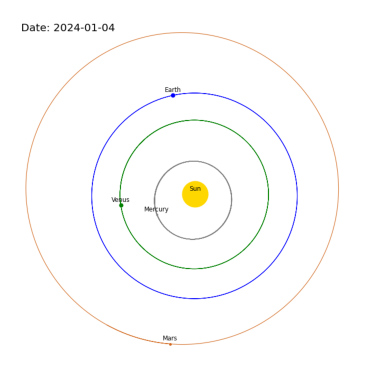

In [44]:
import matplotlib.image as mpimg

# Image path in your directory
image_2_path = '/home/sergio/Escritorio/Master/Comunicación de la Astrofísica/Proyecto TIC/ProyectoTICPrueba/solar_system_last_frame_final.png'

# Load the image using matplotlib.image
image_2 = mpimg.imread(image_2_path)

# Show the image
plt.imshow(image_2)
plt.axis('off') 
plt.show()

After the simulation runs, our working directory will contain two images—the initial and final frames—along with a GIF of the entire animation.

As an extra step, since we now have the GIF file, we can use the *IPython.display* package to view it in Jupyter Notebook. By specifying the file path and using *Image*, we can display the continuous playback of the final GIF.

(Note: This part may not be visible on GitHub, but it provides a way to view GIFs in Jupyter).

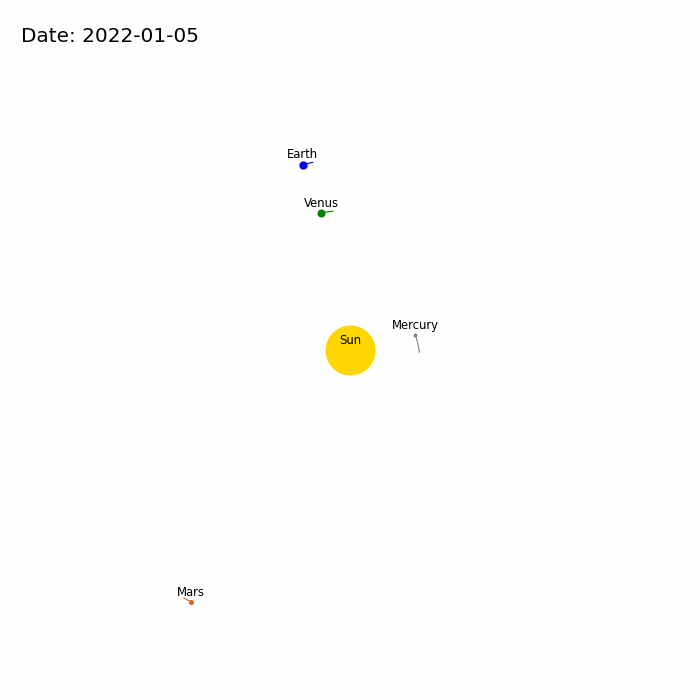

In [47]:
from IPython.display import Image

# GIF path in your directory
gif_path = '/home/sergio/Escritorio/Master/Comunicación de la Astrofísica/Proyecto TIC/ProyectoTICPrueba/solar_system_animation.gif'

# Show the GIF in Jupyter Notebook
Image(filename=gif_path)

This concludes our tutorial on creating a basic Solar System simulation. Beyond the specific simulation, the key takeaway is gaining proficiency in working with objects in *Python* and various packages like Horizons. This knowledge can be applied across different fields and applications.